# Train a DCGAN

Training script for DCGAN adhering to config.py

In [1]:
# frameworks
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# utils
import config
from discriminator import Discriminator
from generator import Generator

Seed: 704
Device: cuda


## Load Image Dataset
This notebook accepts 2 options:
1. Manually upload the dataset to this VM workspace (sufficient for small datasets)
2. Store as a zip file in your Google Drive, and unzip (recommended for large datasets)

Either way, make sure to set `dataroot` in `config.py` accordingly. `dataroot` must be a path to the parent directory containing all class folders. That is, each subfolder contains image files only. For example:


my_dataset/

├── class_A/

│   ├── image_1.jpg

│   └── image_2.jpg

└── class_B/

│    ├── image_3.jpg   
│    └── image_4.jpg
  
Here, `dataroot` should be set to `"my_dataset"`

We are going to use the [Kaggle Butterfly Dataset](https://www.kaggle.com/datasets/phucthaiv02/butterfly-image-classification?resource=download). The code below assumes it is already added as a zip file in your Drive.

In [2]:
# access google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# download as zip
import zipfile

# path to your zip file in Drive
zip_path = '/content/drive/MyDrive/butterfly-image-classification.zip'

# unzip to Colab's VM
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/datasets/butterfly')

In [5]:
# merge train and test, since we just need 1 collection of images
import shutil
import os

# Define your folder paths
folder1 = '/content/datasets/butterfly/test'  # Source folder (the one you want to merge FROM)
folder2 = '/content/datasets/butterfly/train'  # Destination folder (the one you want to merge INTO)

# Create destination folder if it doesn't exist
os.makedirs(folder2, exist_ok=True)

# Copy all files from folder1 to folder2
for item in os.listdir(folder1):
    src = os.path.join(folder1, item)
    dst = os.path.join(folder2, item)

    if os.path.isdir(src):
        shutil.copytree(src, dst, dirs_exist_ok=True)  # For directories
    else:
        shutil.copy2(src, dst)  # For files

print("Folders merged successfully!")

Folders merged successfully!


In [6]:
# delete test set
shutil.rmtree(folder1)

In [10]:
# make sure to remove '.ipynb_checkpoints' directory, if it exists
checkpoint_dir = os.path.join(config.dataroot, '.ipynb_checkpoints')
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

Now let's make a dataloader object to facilitate our training loop.

In [11]:
print(config.dataroot)

datasets/butterfly


In [12]:
# configs
batch_size = 128
num_workers = 2

# construct an image folder dataloader
dataset = dset.ImageFolder(
    root=config.dataroot,
    transform=transforms.Compose([
        transforms.Resize(config.image_size),
        transforms.CenterCrop(config.image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
))

# OPTIONAL: specify a random subset of the dataset to use
#subset_size = 2000
#image_paths = dataset.imgs  # get list of image paths
#subset_paths = random.sample(image_paths, subset_size)  # random sample
#subset = torch.utils.data.Subset(dataset, [dataset.imgs.index(path) for path in subset_paths]) # put this in the dataloader

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=num_workers)

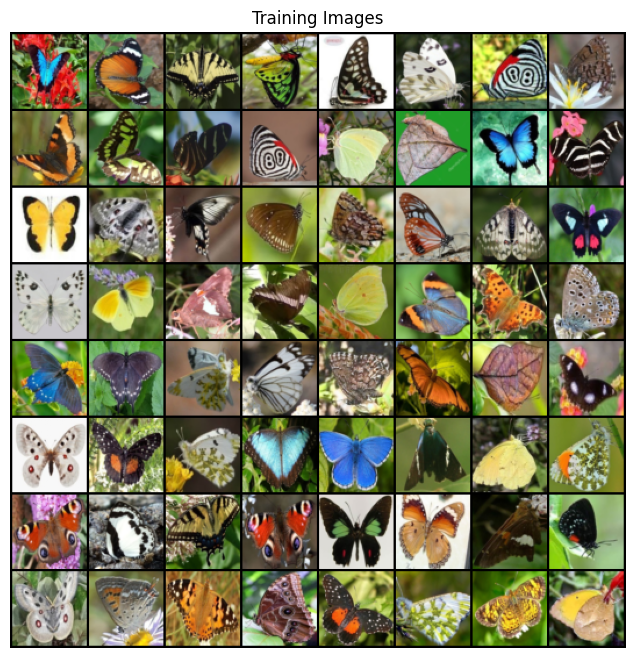

In [13]:
# plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(config.device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# Initialize Model
Initialize the Generator and Discriminator for the DCGAN.

In [ ]:
# OPTIONAL: Load an existing model instead (TODO)
# skip to training after loading a pretrained model
pass

In [14]:
# custom weights initialization called on generator and discriminator obj
def weights_init(
        m: nn.Module,
        conv_mean=0.0,
        conv_std=0.02,
        batchnorm_mean=1.0,
        batchnorm_std=0.02) -> None:
    """
    Initialize the weights of an nn layer.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, conv_mean, conv_std)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, batchnorm_mean, batchnorm_std)
        nn.init.constant_(m.bias.data, 0)

In [15]:
# define the generator obj
netG = Generator(config.nz, config.ngf, config.nc).to(config.device)

# apply weights_init function to randomly initialize all weights.
# by default, mean=0, stdev=0.02
netG.apply(weights_init)

print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [16]:
# define discriminator obj
netD = Discriminator(config.nc, config.ndf).to(config.device)

# apply weights_init function to randomly initialize all weights.
# by default, mean=0, stdev=0.02
netD.apply(weights_init)

print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


# Training Setup

Due to the nature of the task, GANs can be unstable while training. Below, we will employ some empirically effective approaches, as per [ganhacks](https://github.com/soumith/ganhacks).

In [31]:
# hyperparameters
num_epochs = 15
lr = 0.0002
beta1 = 0.5

# loss fn (binary cross entropy)
criterion = nn.BCELoss()

# create batch of latent vectors that we will use to visualize the progression of the generator
fixed_noise = torch.randn(64, config.nz, 1, 1, device=config.device)

# establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# load Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [32]:
# Training Loop

# lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0
save_interval = 100

print("Starting Training Loop...")
for epoch in range(num_epochs):  # epoch loop
    for i, data in enumerate(dataloader, 0):  # minibatch loop

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(config.device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=config.device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, config.nz, 1, 1, device=config.device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % save_interval == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/15][0/51]	Loss_D: 0.0957	Loss_G: 3.4096	D(x): 0.9388	D(G(z)): 0.0229 / 0.1158
[0/15][50/51]	Loss_D: 0.1921	Loss_G: 5.8558	D(x): 0.9208	D(G(z)): 0.0669 / 0.0100
[1/15][0/51]	Loss_D: 0.1998	Loss_G: 3.8631	D(x): 0.8698	D(G(z)): 0.0213 / 0.0523
[1/15][50/51]	Loss_D: 0.0842	Loss_G: 6.3294	D(x): 0.9409	D(G(z)): 0.0126 / 0.0059
[2/15][0/51]	Loss_D: 0.0936	Loss_G: 5.1749	D(x): 0.9487	D(G(z)): 0.0128 / 0.0153
[2/15][50/51]	Loss_D: 0.0813	Loss_G: 4.7195	D(x): 0.9497	D(G(z)): 0.0218 / 0.0189
[3/15][0/51]	Loss_D: 0.1313	Loss_G: 3.6678	D(x): 0.9277	D(G(z)): 0.0366 / 0.0542
[3/15][50/51]	Loss_D: 0.2688	Loss_G: 3.8458	D(x): 0.8206	D(G(z)): 0.0199 / 0.0641
[4/15][0/51]	Loss_D: 0.3284	Loss_G: 6.4862	D(x): 0.9388	D(G(z)): 0.1652 / 0.0081
[4/15][50/51]	Loss_D: 0.0911	Loss_G: 5.1749	D(x): 0.9663	D(G(z)): 0.0462 / 0.0184
[5/15][0/51]	Loss_D: 0.2446	Loss_G: 5.9094	D(x): 0.9483	D(G(z)): 0.1267 / 0.0102
[5/15][50/51]	Loss_D: 0.1336	Loss_G: 4.7136	D(x): 0.9541	D(G(z)): 0.0718 / 0.0

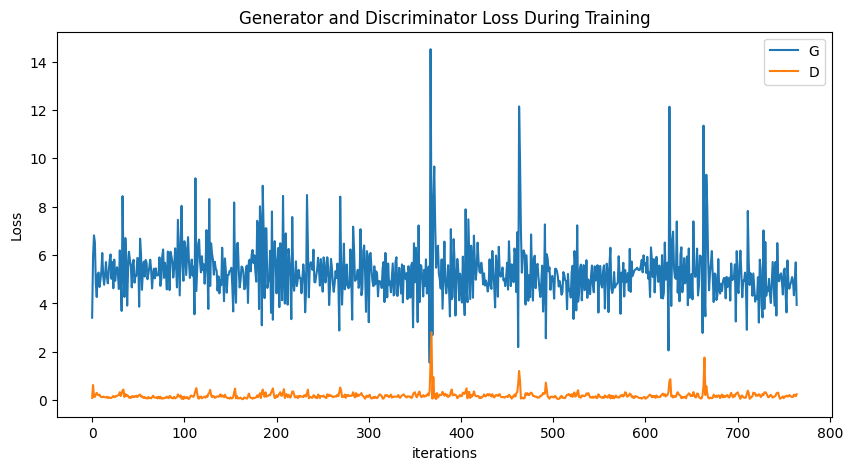

In [33]:
# visualize training results
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

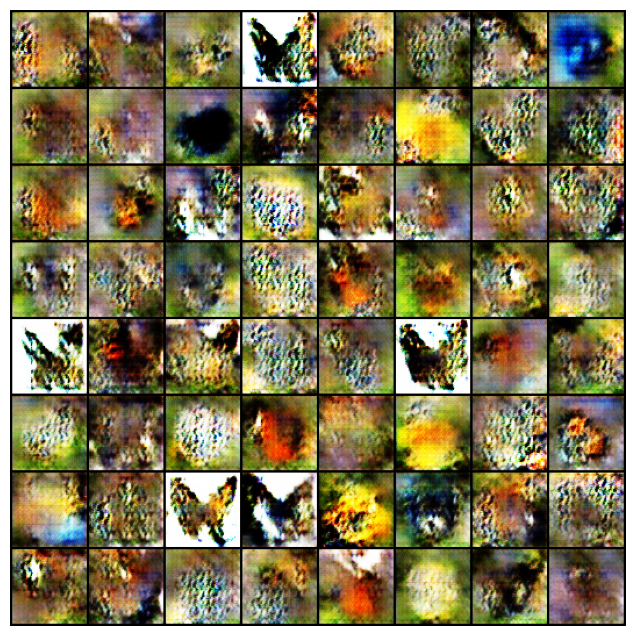

In [34]:
# visualize G's progress over epochs
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

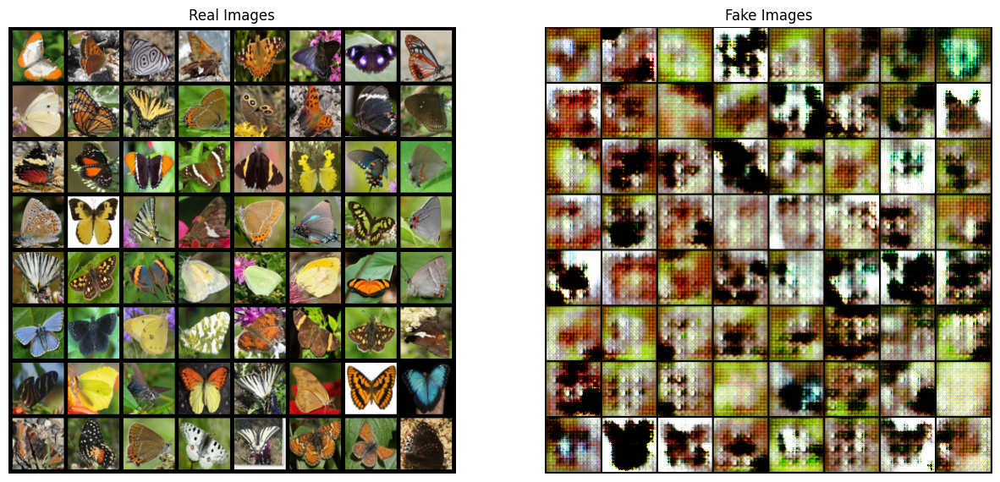

In [26]:
# compare real images alongside fake images

# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(config.device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# Optional: Save Model

In [ ]:
# TODO
pass